In [18]:
import pickle
import json
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
from scipy.spatial.distance import cdist
import random
from scipy.spatial.distance import cosine
from collections import defaultdict
import os


In [ ]:
embedding_file = '/fs/ess/PAS2136/ggr_data/image_data/GZCD/annotations/pipeline_steps_out/miew_id_step5/miewid_census.pickle'
annotation_file = '/fs/ess/PAS2136/ggr_data/image_data/GZCD/annotations/reid_census.json'


#ankit
clustering_file = '/fs/ess/PAS2136/ggr_data/results/Grevys_Experiment_4/lca_output/final_fs_output_LCA_left.json'
annotation_file = '/fs/ess/PAS2136/ggr_data/results/Grevys_Experiment_4/frame_sampling/stage1_fs_output.json'   


In [ ]:
import pickle
import json
import numpy as np
import pandas as pd
from itertools import combinations

# 1. Load embeddings and UUIDs
with open(embeddings_file, 'rb') as f:
    data = pickle.load(f)
    embeddings = np.array(data[0])
    uuids = np.array(data[1])

# 2. Load annotation data
with open(annotations_file, 'r') as f:
    annot_data = json.load(f)
    annotations = pd.DataFrame(annot_data['annotations'])
    images = pd.DataFrame(annot_data['images'])  # ← FIXED this line

# Combine annotations with image info if needed
df_res_combined = annotations.merge(images, left_on='image_uuid', right_on='uuid', suffixes=('', '_image'))

# 3. Map UUIDs to individual IDs, filter to only those in the pickle
uuid_to_individual = dict(zip(annotations['annot_uuid'], annotations['individual_id']))
mask = np.array([uuid in uuid_to_individual for uuid in uuids])
embeddings = embeddings[mask]
uuids = uuids[mask]
individual_ids = np.array([uuid_to_individual[uuid] for uuid in uuids])

# 4. Create all unique pairs (could be huge)
pairs = list(combinations(range(len(uuids)), 2))

print(f"Number of unique pairs: {len(pairs)}")




Number of unique pairs: 8142630


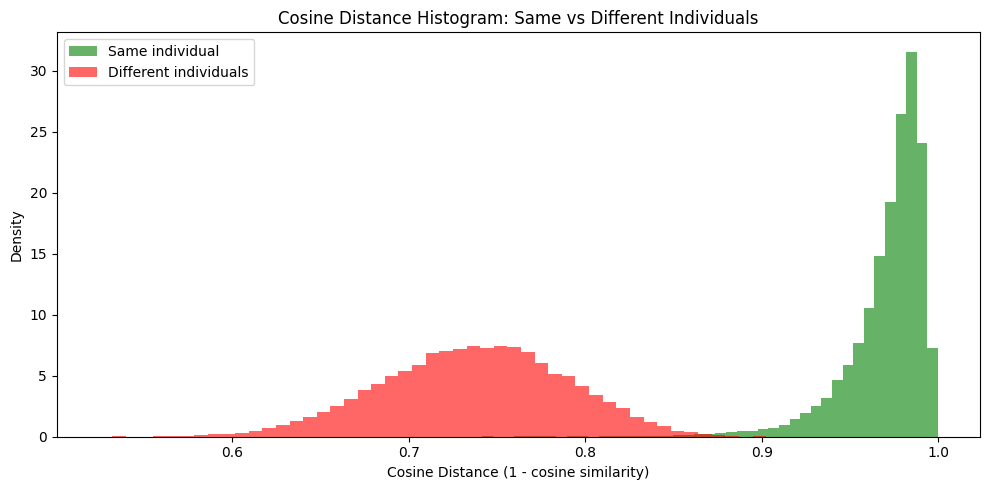

In [19]:
# Group indices by individual
individual_to_indices = defaultdict(list)
for idx, ind in enumerate(individual_ids):
    individual_to_indices[ind].append(idx)

# Generate same and different pairs
same_pairs = []
diff_pairs = []
individual_ids_list = list(individual_to_indices.keys())

for indices in individual_to_indices.values():
    if len(indices) > 1:
        same_pairs.extend(list(combinations(indices, 2)))

while len(diff_pairs) < len(same_pairs):
    i1, i2 = random.sample(range(len(individual_ids)), 2)
    if individual_ids[i1] != individual_ids[i2]:
        diff_pairs.append((i1, i2))

# Sample the pairs
sample_size = 50000
same_pairs_sample = random.sample(same_pairs, min(sample_size, len(same_pairs)))
diff_pairs_sample = random.sample(diff_pairs, min(sample_size, len(diff_pairs)))

def get_embeddings_score(embedding1, embedding2):        
    return get_score_from_cosine_distance(cosine(embedding1, embedding2))
        
        
def sign_power(x, power):
    return np.sign(x) * np.power(np.abs(x), power)  

def get_score_from_cosine_distance(cosine_dist):        
    return 1 - sign_power(cosine_dist, 2) * 0.5

def compute_cosine_scores(pairs):
    emb1 = embeddings[[i for i, j in pairs]]
    emb2 = embeddings[[j for i, j in pairs]]
    
    # Compute cosine distance
    dot_products = np.sum(emb1 * emb2, axis=1)
    norms1 = np.linalg.norm(emb1, axis=1)
    norms2 = np.linalg.norm(emb2, axis=1)
    cosine_sim = dot_products / (norms1 * norms2 + 1e-10)
    cosine_dist = 1 - cosine_sim
    
    # Apply your custom scoring transformation
    scores = get_score_from_cosine_distance(cosine_dist)
    return scores


scores_same = compute_cosine_scores(same_pairs_sample)
scores_diff = compute_cosine_scores(diff_pairs_sample)

# Plot
plt.figure(figsize=(10, 5))
plt.hist(scores_same, bins=50, color='green', alpha=0.6, label='Same individual', density=True)
plt.hist(scores_diff, bins=50, color='red', alpha=0.6, label='Different individuals', density=True)
plt.xlabel('Cosine Distance (1 - cosine similarity)')
plt.ylabel('Density')
plt.title('Cosine Distance Histogram: Same vs Different Individuals')
plt.legend()
plt.tight_layout()
plt.show()


In [28]:
import json

# Load the node2uuid mapping
with open('/fs/ess/PAS2136/ggr_data/image_data/GZCD/annotations/pipeline_steps_out/clustering_step6/node2uuid.json', 'r') as f:
    node2uuid = json.load(f)

# Invert the mapping: uuid -> node_id (as string)
uuid2node = {v: str(k) for k, v in node2uuid.items()}

# Add the node column to your DataFrame (assuming 'uuid' is the column in your df)
df_res_combined['node'] = df_res_combined['annot_uuid'].map(uuid2node)

base_dir = '/fs/ess/PAS2136/ggr_data/image_data/GZCD/images'  # adjust as needed
df_res_combined['img_path'] = df_res_combined['file_name'].apply(lambda x: os.path.join(base_dir, x))

In [24]:
df_res_combined.sample()

,annot_uuid,image_uuid,bbox,annot_census,viewpoint,individual_id,annot_species,uuid,file_name,datetime,latitude,longitude,width,height,node,img_path
1814,70819d73-a615-474d-8801-6c367125c733,d650cf7a-b71b-aa14-6a8c-9735feab4882,"[534, 392, 1620, 1019]",True,right,117abb1d-f1b9-4160-8cc5-a485bedf21db,zebra_grevys,d650cf7a-b71b-aa14-6a8c-9735feab4882,d650cf7a-b71b-aa14-6a8c-9735feab4882.jpg,2016-01-30T08:19:34,-1.0,-1.0,2592,1944,184,/fs/ess/PAS2136/ggr_data/image_data/GZCD/image...


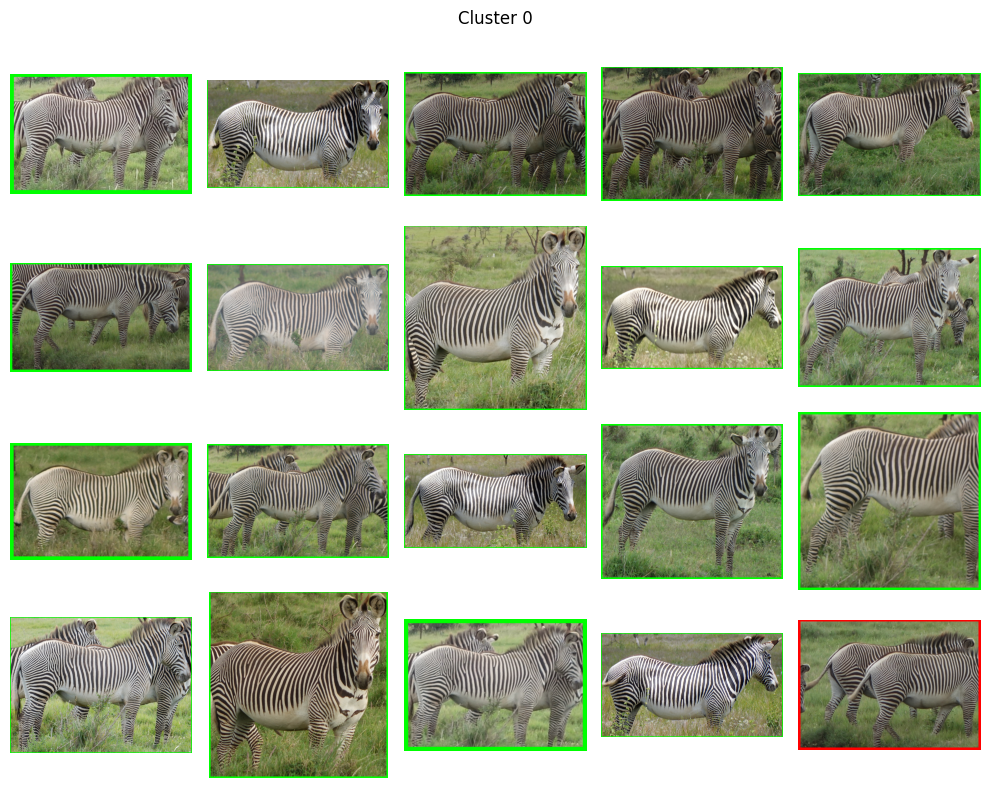

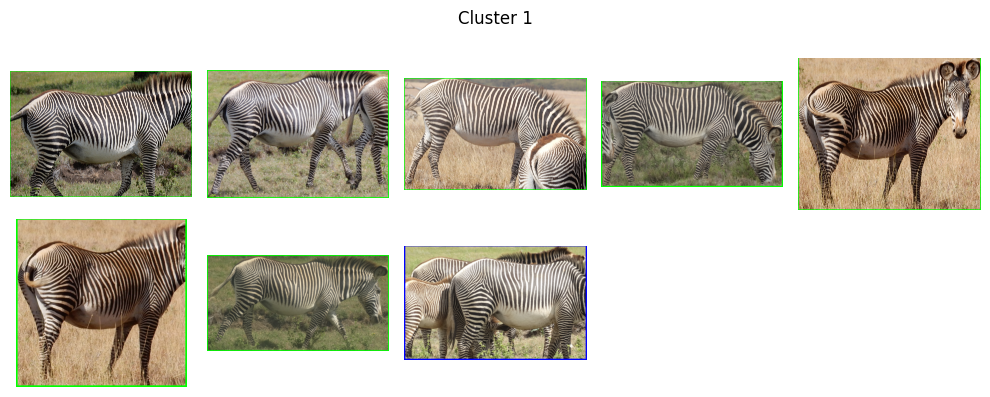

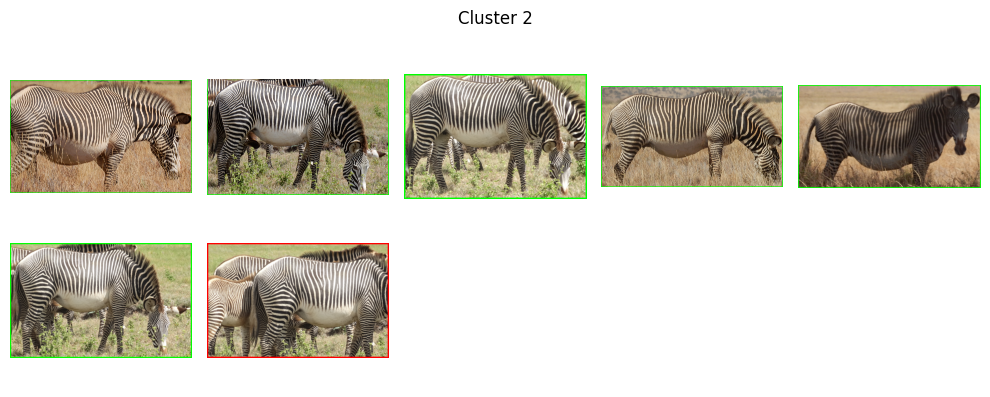

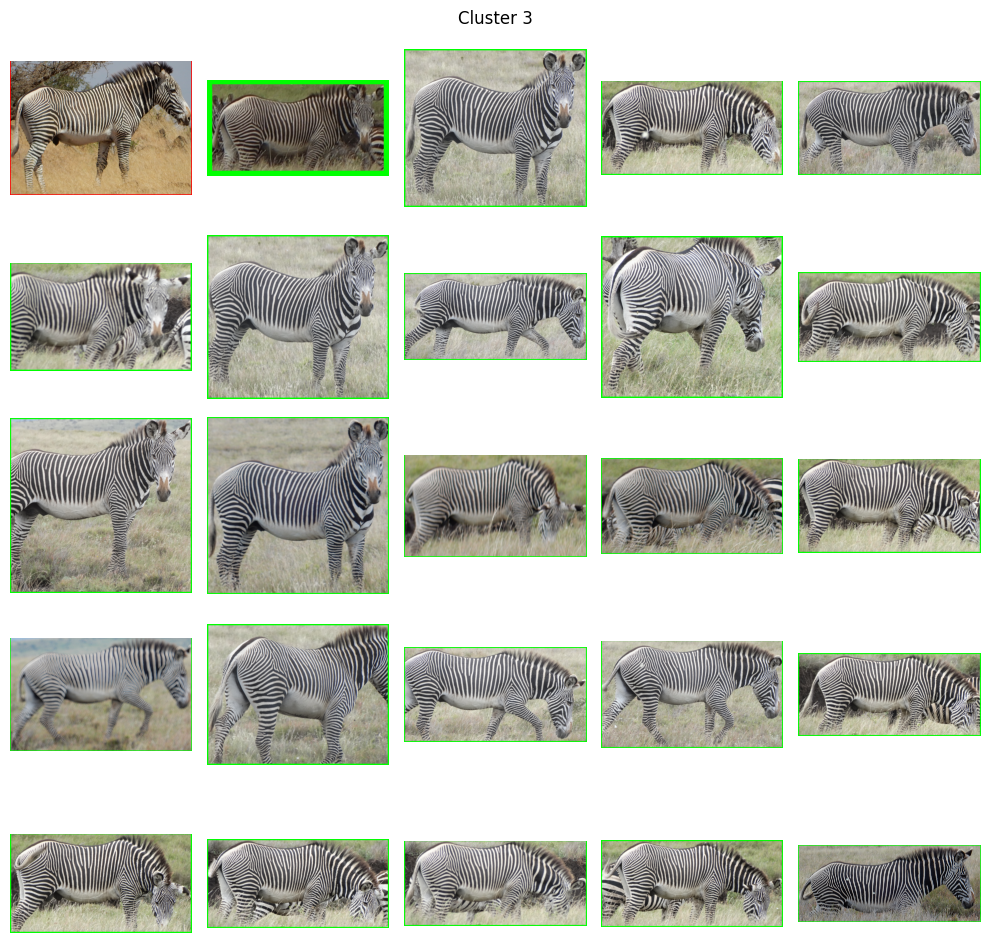

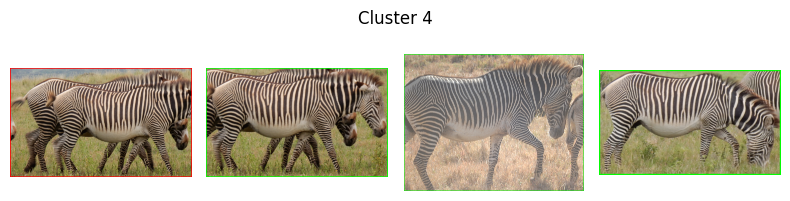

...

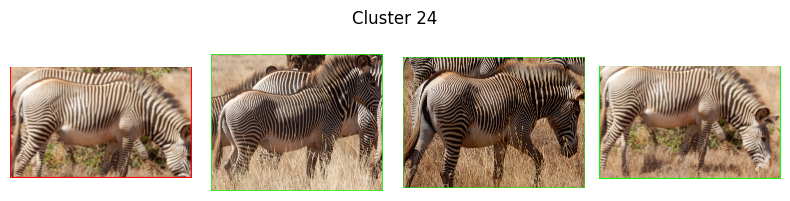

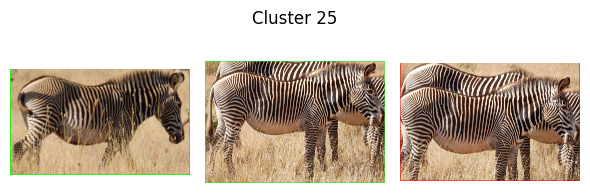

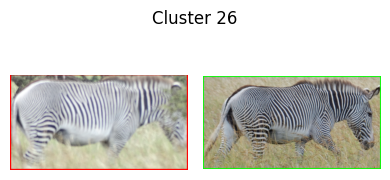

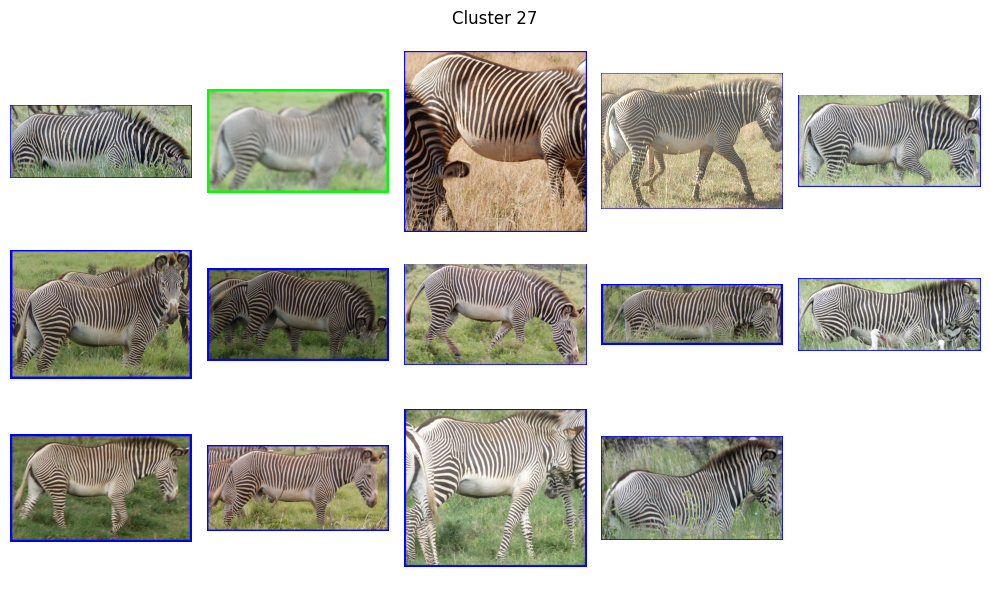

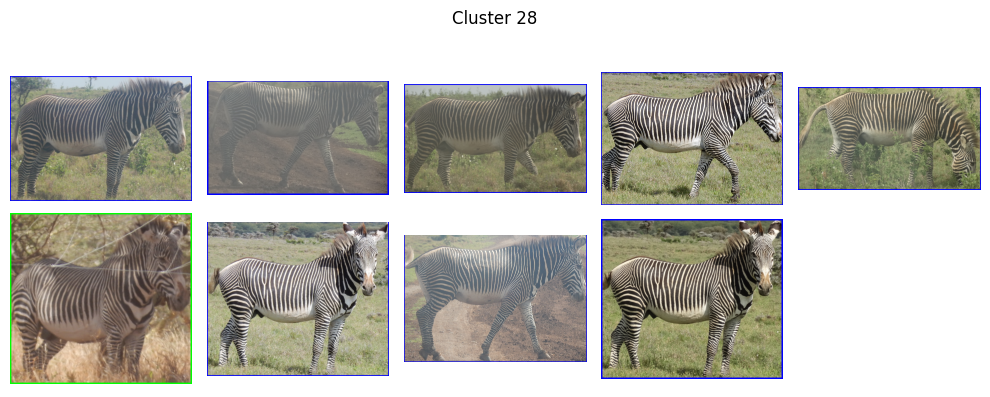

In [ ]:
import json
import pandas as pd
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np

df = df_res_combined



# Load clustering info
with open('/fs/ess/PAS2136/ggr_data/image_data/GZCD/annotations/pipeline_steps_out/clustering_step6/clustering.json', 'r') as f:
    clusters = json.load(f)

color_map = {
    'both': (0, 255, 0),     # Green
    'lca': (255, 0, 0),      # Red
    'gt': (0, 0, 255)      # Yellow
}

def get_border_color(node, lca_set, gt_set):
    if node in lca_set and node in gt_set:
        return color_map['both']
    elif node in lca_set:
        return color_map['lca']
    else:
        return color_map['gt']

def crop_and_border(row, color, border_width=5):
    img = Image.open(row['img_path']).convert('RGB')
    x, y, w, h = row['bbox']  # Adjust if your bbox format is different
    crop = img.crop((x, y, x+w, y+h))
    draw = ImageDraw.Draw(crop)
    for i in range(border_width):
        # Draw rectangle border, shrinking in by i pixels each time for thickness
        draw.rectangle(
            [i, i, crop.width-1-i, crop.height-1-i],
            outline=color,
            width=8
        )
    return crop

for idx, cluster_pair in enumerate(clusters):
    lca_nodes = set(cluster_pair['LCA clustering'])
    gt_nodes = set(cluster_pair['GT clustering'])
    all_nodes = lca_nodes.union(gt_nodes)

    crops = []
    missing_nodes = []
    for node in all_nodes:
        mask = df['node'] == str(node)
        if mask.any():
            row = df[mask].iloc[0]
            color = get_border_color(node, lca_nodes, gt_nodes)
            crop = crop_and_border(row, color)
            crops.append(crop)
        else:
            missing_nodes.append(node)

    if missing_nodes:
        print(f"Warning: The following nodes were not found in the DataFrame: {missing_nodes}")

    # Display crops in rows of at most 3
    n_crops = len(crops)
    n_cols = min(5, n_crops)
    n_rows = int(np.ceil(n_crops / 5    ))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(2*n_cols, 2*n_rows))
    axs = np.array(axs).reshape(-1)  # Flatten in case of single row

    for i, crop in enumerate(crops):
        axs[i].imshow(crop)
        axs[i].axis('off')
    # Hide unused axes
    for j in range(i+1, len(axs)):
        axs[j].axis('off')
    plt.suptitle(f'Cluster {idx}')
    plt.tight_layout()
    plt.show()

In [ ]:
clustering_file = ""